#Финальный проект обучения курса CV-инженер. Часть 2.

##Задача 3. Сравнение позы на видео

###Предварительные работы

Загрузка библиотек

In [2]:
import os
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import math
import torch
import torchvision
from torchvision.transforms import v2
from albumentations.pytorch.transforms import ToTensorV2
import albumentations as A
import pose_detection_utils
from IPython import display
from IPython.display import HTML
from base64 import b64encode
import moviepy.editor
import gc
import time
from tqdm.auto import tqdm

Отобразим рефренсное видео

In [3]:
reference_video = "dspr_cv_u1_diploma_spr3_2.mp4"

Для отображения в Google Colab пришлось использовать некоторую хитрость. Т.к. библиотека openCV не может кодировть видео кодеком H264 (а именно он отображается большинстовм браузеров), то перед тем как вывести изображение, предварительно перекодируем его при помощи ffmpeg и отобразим уже это временное переконвериторованное изображение.

Благодаря тому, что отображение просиходит путем вставления в тег html video embed видео путем его конвертации в base64 кодированную строку.

In [4]:
def show_video(video_path, video_width = 400):
  os.system(f"ffmpeg -y -i {video_path} -vcodec libx264 -f mp4 tmp_output_h264.mp4")
  return moviepy.editor.ipython_display('tmp_output_h264.mp4', width = video_width)

In [5]:
show_video(reference_video)

Итак видео загружается и отображается.

###Детекция и отображение ключевых точек на видео

Изначально попробуем оборазить ключевые точку, путем детекции точек и отрисовки скелета для каждого кадра изображения при помощи класса созданного в предыдщем юните, помещенным в модуль pose_detection_utils

In [7]:
from google.colab.patches import cv2_imshow
cap = cv2.VideoCapture(reference_video) # загрузка видео
frameRate = cap.get(5) # частота кадров
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output.mp4', fourcc, frameRate, (int(cap.get(3)),int(cap.get(4))))

while(cap.isOpened() and cap.get(0)<17500):
  #frameId = cap.get(1) # номер текущего кадра
  ret, frame = cap.read()
  if (ret != True):
      break
  else:
      if cap.get(0)>10000:
        pose = pose_detection_utils.pose_model(frame)
        img = pose.draw_coloured_skeleton()
        img[img<0]=0
        out.write(np.uint8(img))
cap.release()
out.release()
cv2.destroyAllWindows()

Downloading: "https://download.pytorch.org/models/keypointrcnn_resnet50_fpn_coco-fc266e95.pth" to /root/.cache/torch/hub/checkpoints/keypointrcnn_resnet50_fpn_coco-fc266e95.pth
100%|██████████| 226M/226M [00:02<00:00, 93.4MB/s]


In [8]:
show_video('output.mp4')

Итак получилось проанализировать таким образом видео и получить выходное видео с отрисованным скелетом. Однако, такой подход очень долог - более 16 минут на 21 секундное видео, во вторых для последующего анализа сходства двух видео, необходимо зранить информацию обо всех кадрах и сами кадры, для последующей визуализации, а попытка сделать это сохранив каждый проанализированный кадр в своем экземпляре класса pose_model привела к переполнению памяти графического ускорителя колаба. Таким образом необходим другой подход.

###Разработка модели для анализа сходства видео, с приемлимыми скоростью и количеством потребляемой памяти.

Для обработки видео создадим отдельный класс, который будет загружать изображения, детектировать ключевые точки, проводить преобразования ключевых точек, а также сравнивать с видео загруженного в такую же модель и вывод видео результата сравнения.

Также в нижележащую кодовую ячейку поместим неоюходимые нам вспомогательные переменные и функции для последующего удобства перенесения их в модель.

In [9]:
#Список ключевых точек
keypoints_name = ['nose','left_eye','right_eye',\
    'left_ear','right_ear','left_shoulder',\
    'right_shoulder','left_elbow','right_elbow',\
    'left_wrist','right_wrist','left_hip',\
    'right_hip','left_knee', 'right_knee', \
    'left_ankle','right_ankle']
#Ключевые точки частей каркаса позы
skeleton = [
    [keypoints_name.index("right_eye"), keypoints_name.index("nose")],
    [keypoints_name.index("right_eye"), keypoints_name.index("right_ear")],
    [keypoints_name.index("left_eye"), keypoints_name.index("nose")],
    [keypoints_name.index("left_eye"), keypoints_name.index("left_ear")],
    [keypoints_name.index("right_shoulder"), keypoints_name.index("right_elbow")],
    [keypoints_name.index("right_elbow"), keypoints_name.index("right_wrist")],
    [keypoints_name.index("left_shoulder"), keypoints_name.index("left_elbow")],
    [keypoints_name.index("left_elbow"), keypoints_name.index("left_wrist")],
    [keypoints_name.index("right_hip"), keypoints_name.index("right_knee")],
    [keypoints_name.index("right_knee"), keypoints_name.index("right_ankle")],
    [keypoints_name.index("left_hip"), keypoints_name.index("left_knee")],
    [keypoints_name.index("left_knee"), keypoints_name.index("left_ankle")],
    [keypoints_name.index("right_shoulder"), keypoints_name.index("left_shoulder")],
    [keypoints_name.index("right_hip"), keypoints_name.index("left_hip")],
    [keypoints_name.index("right_shoulder"), keypoints_name.index("right_hip")],
    [keypoints_name.index("left_shoulder"), keypoints_name.index("left_hip")],
]
#ключевые точки торса
body_points = [
    keypoints_name.index("right_shoulder"),
    keypoints_name.index("left_shoulder"),
    keypoints_name.index("right_hip"),
    keypoints_name.index("left_hip")
]
#Ключевые точки головы
head_points = [
    keypoints_name.index("right_eye"),
    keypoints_name.index("left_eye"),
    keypoints_name.index("nose"),
    keypoints_name.index("right_ear"),
    keypoints_name.index("left_ear"),
]
#Ключевые точки векторов частей конечностей
limbs_vectors = [
    [keypoints_name.index("right_shoulder"), keypoints_name.index("right_elbow")],
    [keypoints_name.index("right_elbow"), keypoints_name.index("right_wrist")],
    [keypoints_name.index("left_shoulder"), keypoints_name.index("left_elbow")],
    [keypoints_name.index("left_elbow"), keypoints_name.index("left_wrist")],
    [keypoints_name.index("right_hip"), keypoints_name.index("right_knee")],
    [keypoints_name.index("right_knee"), keypoints_name.index("right_ankle")],
    [keypoints_name.index("left_hip"), keypoints_name.index("left_knee")],
    [keypoints_name.index("left_knee"), keypoints_name.index("left_ankle")],
]
#Список ключеых точек конечностей, для последующего получения значения результата сравления для конкретной точки.
limbs_points = [
    keypoints_name.index("right_elbow"),
    keypoints_name.index("right_wrist"),
    keypoints_name.index("left_elbow"),
    keypoints_name.index("left_wrist"),
    keypoints_name.index("right_knee"),
    keypoints_name.index("right_ankle"),
    keypoints_name.index("left_knee"),
    keypoints_name.index("left_ankle")
]
#Ключевые точки отдельных конечностей
RIGHT_ARM = [0, 1]
LEFT_ARM = [2, 3]
RIGFT_LEG = [4, 5]
LEFT_LEG = [6, 7]
#Значения цветов для отображения
RED = (0, 0, 255)
GREEN = (0, 255, 0)
YELLOW = (0, 255, 255)
#Цветовая палитра для отрисовки скелета
cmap = plt.get_cmap("rainbow")
colour_step=255 // len(skeleton) # Зададим шаг цвета
#добавление цвета для линий скелета позы.
for i in range(len(skeleton)):
    colour = cmap(i * colour_step / 255)
    colour = (colour[0]*255, colour[1]*255, colour[2]*255, colour[3]*255)
    skeleton[i].append(colour)
#Функция для нахождения точки пересечения линий
def line_intersection(line1, line2):
    xdiff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    ydiff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    def det(a, b):
        return a[0] * b[1] - a[1] * b[0]

    div = det(xdiff, ydiff)
    if div == 0:
       raise Exception('lines do not intersect')

    d = (det(*line1), det(*line2))
    x = det(d, xdiff) / div
    y = det(d, ydiff) / div
    return [x, y]
#Класс модели для сравнения позы видео
class pose_video_model:
    #Статические переменные
    #Загрузим модель детекции сразу в статическую переменную,
    #таким образом избежим потерь времени и памяти, для загрузки модели как для каждого экземпляра объекта, так и для каждого фрейма видео.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = torchvision.models.detection.keypointrcnn_resnet50_fpn(weights=torchvision.models.detection.KeypointRCNN_ResNet50_FPN_Weights.DEFAULT).to(device)
    model.eval()
    #Единичныйй и нулевойтензоры для последующих вычеслений.
    one = torch.tensor(1, requires_grad=False, device=device)
    zero = torch.tensor(0, requires_grad=False, device=device)
    #Конструктор модели
    '''Принимает путь к видеофалу,
    стартовое и конечное время в миллисекундах,
    Коэфициенты для поправки сводного вектора тела и головы,
    Размер срединного вектора тела, для масштабирования,
    Значение трэшхолда для значения достоверности ключевых точек.
    '''
    def __init__(self, video_file, start_time_ms = 0, end_time_ms = 1e+10, body_coef = 10, head_coef = 5, body_height = 500, keypoint_threshold=2):
        self.head_coef = head_coef
        self.body_coef = body_coef
        self.body_height = body_height
        self.kp_threshold = keypoint_threshold
        print("Reading frames...")
        cap = cv2.VideoCapture(video_file) # загрузка видео
        self.frameRate = cap.get(5) # частота кадров
        self.video_width = cap.get(3)
        self.video_height = cap.get(4)
        #Основной член класса, в виде списка содержащего кадр, ключевые точки и их анализ.
        self.frames = []
        #Загрузка фремов в цикле
        def generator():
            while(cap.isOpened() and cap.get(0)<end_time_ms):
                ret, frame = cap.read()
                if (ret != True):
                    break
                else:
                    if cap.get(0)>start_time_ms:
                        with torch.no_grad():
                            item = {'image': frame}
                            transform = v2.Compose([torchvision.transforms.ToTensor()])
                            im_tensor = transform(frame).to(pose_video_model.device)
                            model_output = pose_video_model.model(im_tensor.unsqueeze(0))[0]
                            item['model_keypoints'], item['model_scores'] = pose_video_model.get_output_for_person(model_output)
                            self.frames.append(item)
                            yield
        for _ in tqdm(generator()): pass
        cap.release()
        #Восстановление ключевых точек при возможности
        print('Restoring keypoints...')
        self.restore_bad_points(keypoint_threshold)
        #Преобразование ключевых точек
        print('Processing keypoints...')
        for item in tqdm(self):
            item['transformed_keypoints'] = pose_video_model.transorm_pose(item['model_keypoints'], body_height)
            item['limbs_vectors_by_start_points'] = pose_video_model.create_limbs_vectors_by_start_points(item['model_keypoints'])
    #Функции для итерируемости объекта модели.
    def __getitem__(self, item):
        if item >= len(self) or item < 0:
            raise IndexError("Frame index out of range")
        return self.frames[item]

    def __len__(self):
        return len(self.frames)
    #Выделение одного детектированного объкта человека на фрейме с наибольшим скором достоверности
    @staticmethod
    def get_output_for_person(input):
        person_index = torch.argmax(input['scores'])
        return input['keypoints'][person_index, ...][...,:-1], input['keypoints_scores'][person_index, ...]
    #Отрисовка видео по фреймам с добавлением скелета из ключеых тоек
    def generate_video_with_skeleton(self, output_file):
        fourcc = cv2.VideoWriter_fourcc('F','M','P','4')
        out = cv2.VideoWriter(output_file, fourcc, int(self.frameRate), (int(self.video_width), int(self.video_height)))
        for frame in self:
            img = self.draw_frame_with_skeleton(frame)
            out.write(np.uint8(img))
        out.release()
        cv2.destroyAllWindows()
    #Отрисовка кадра со скелетом
    def draw_frame_with_skeleton(self, frame, keypoint_threshold=2, line_thickness=5):
        img = frame['image']
        if(type(img) == torch.Tensor):
            img = img.cpu().permute(1, 2, 0).numpy()
        # создаём копию изображений
        img_copy = cv2.bitwise_not(img.copy()*255)
        color = (0, 255, 0)
        keypoints_restored = []
        for kp in range(len(frame['model_keypoints'])):
            # конвертируем массив ключевых точек в список целых чисел
            keypoint = tuple(
                map(int, frame['model_keypoints'][kp].detach().cpu().numpy().tolist())
            )
            keypoints_restored.append(keypoint)
            # рисуем кружок радиуса 5 вокруг точки
            cv2.circle(img_copy, keypoint, 5, -1)
        for limb in skeleton:
            first = limb[0]
            second = limb[1]
            if (frame['model_scores'][first] and frame['model_scores'][second])>keypoint_threshold:
                cv2.line(img_copy, keypoints_restored[first], keypoints_restored[second], limb[2], line_thickness)
        del keypoints_restored
        return img_copy
    #Перенос ключевых точек с центорм тела фигуры в начале координат
    @staticmethod
    def transpose_keypoints(keypoints):
        # Базовые точки туловища
        left_hip = keypoints[keypoints_name.index('left_hip')]
        right_hip = keypoints[keypoints_name.index('right_hip')]
        left_shoulder = keypoints[keypoints_name.index('left_shoulder')]
        right_shoulder = keypoints[keypoints_name.index('right_shoulder')]
        body_center = torch.stack(line_intersection([left_hip, right_shoulder], [right_hip, left_shoulder]))
        result = []
        for kp in keypoints:
            result.append(kp - body_center)
        return result
    #Выделение срединного вектора тела для вращения и масштабирования
    @staticmethod
    def calculate_body_vector(keypoints):
        # Базовые точки туловища
        left_hip = keypoints[keypoints_name.index('left_hip')]
        right_hip = keypoints[keypoints_name.index('right_hip')]
        left_shoulder = keypoints[keypoints_name.index('left_shoulder')]
        right_shoulder = keypoints[keypoints_name.index('right_shoulder')]
        inter_hips_dot = right_hip + (left_hip - right_hip)/2
        inter_shoulders_dot = right_shoulder + (left_shoulder - right_shoulder)/2
        return inter_hips_dot - inter_shoulders_dot
    #Поворот ключевых тоек
    @staticmethod
    def rotate_keypoints(keypoints, body_vector):
        magnitude = torch.linalg.vector_norm(body_vector)
        sin = body_vector[0] / magnitude
        cos = body_vector[1] / magnitude
        M = torch.stack([torch.stack([cos, -sin]), torch.stack([sin, cos])])
        result = torch.matmul(torch.stack(keypoints), M.T)
        return result
    #Масштабирование векторов
    @staticmethod
    def scale_keypoints(keypoints, body_vector, body_height):
        scale = torch.linalg.vector_norm(body_vector / body_height)
        scale = pose_video_model.one / scale
        M = torch.stack([torch.stack([scale, pose_video_model.zero]), torch.stack([pose_video_model.zero, scale])])
        result = torch.matmul(keypoints, M.T)
        return result
    #Функция объединяющая все трансформации
    @staticmethod
    def transorm_pose(key_points, body_height):
        transformed = pose_video_model.transpose_keypoints(key_points)
        body_vector = pose_video_model.calculate_body_vector(transformed)
        transformed = pose_video_model.rotate_keypoints(transformed, body_vector)
        return pose_video_model.scale_keypoints(transformed, body_vector, body_height)
    #Функция для транспонирования векторов частей конечностей с точкой начала в (0, 0)
    @staticmethod
    def create_limbs_vectors_by_start_points(key_points):
        result = torch.empty((len(limbs_vectors), 2)).to(pose_video_model.device)
        for i, limb in enumerate(limbs_vectors):
            result[i] = key_points[limb[1]] - key_points[limb[0]]
        return result

    #Функция для сравнения позы на двух видео покадрово на основании косинусной близости по транспонированным и преобразованным векторам частей тела.
    def compare(self, pose_to_compare):
        self.comparing_model = pose_to_compare
        self.comparing_lenght = len(self) if len(self) < len (pose_to_compare) else len(pose_to_compare)
        self.frames_scores = []
        limbs_scores = []
        head_scores = []
        body_scores = []
        limbs_scores = []
        for i in tqdm(range(self.comparing_lenght)):
            # Поскольку в результате преобразования позиция туловища оказывается фиксированной,
            # то его вектора будут менятся крайне незначительно.
            # И чтобы придать этим изменениям больший вес возведем значения косинусной близости этих точек в степень
            self[i]['body_score'] = pose_detection_utils.cosine_similarity(self[i]['transformed_keypoints'][body_points], pose_to_compare[i]['transformed_keypoints'][body_points])**self.body_coef
            body_scores.append(np.mean(self[i]['body_score']))
            # Вектора головы также будут менятся незначительно тк размах ее движений не очень вилик
            # Поэтому тоже возведем их косинусную близость в степень
            self[i]['head_score'] = pose_detection_utils.cosine_similarity(self[i]['transformed_keypoints'][head_points], pose_to_compare[i]['transformed_keypoints'][head_points])**self.head_coef
            head_scores.append(np.mean(self[i]['head_score']))
            # для финального подсчета голову и туловище будем учитывать как отдельные точки целеком
            self[i]['limbs_score'] = pose_detection_utils.cosine_similarity(self[i]['limbs_vectors_by_start_points'], pose_to_compare[i]['limbs_vectors_by_start_points'])
            limbs_scores.append(np.mean(self[i]['limbs_score']))
            scores = [np.mean(self[i]['body_score']), np.mean(self[i]['head_score'])]
            scores.extend(self[i]['limbs_score'])
            self.frames_scores.append(np.mean(scores))
        return {'general_scores': self.frames_scores, 'body_scores': body_scores, 'head_scores': head_scores, 'limbs_scores': limbs_scores}
    #Функция для отрисовки виде с анализом сходства
    def generate_comparing_video(self, output_file, height = 800):
        if self.comparing_model == None:
            print('No object to compare')
            return
        im1 = self[0]['image']
        im2 = self.comparing_model[0]['image']
        own_width = int(self.compute_frame_width(im1, height - 100))
        other_width = int(self.compute_frame_width(im2, height - 100))
        output_width = int(own_width + other_width + 10)
        fourcc = cv2.VideoWriter_fourcc('F','M','P','4')
        out = cv2.VideoWriter(output_file, fourcc, int(self.frameRate), (int(output_width), int(height)))

        for i in tqdm(range(len(self))):
            img = self.draw_comparing_frame(i, height)
            #print(img)
            #plt.imshow(img)
            out.write(np.uint8(img))
        out.release()
        cv2.destroyAllWindows()
    #Отрисовка фреймов для видео сравнения - на одном кадре помещаются сразу и референсное видео и видео для сравнения,
    #а также выводятся ключевые точки видео для сранвниея, с цетом и размером, согласно косинусной близостти - меньше болье и краснее
    def draw_comparing_frame(self, index, height = 800):
        if self.comparing_model == None:
            print('No object to compare')
            return
        else:
            im1 = self[0]['image']
            im2 = self.comparing_model[0]['image']
            im_height = height - 100
            font                   = cv2.FONT_HERSHEY_SIMPLEX
            font_scale              = 5e-1
            thickness              = 1
            own_width = int(self.compute_frame_width(im1, im_height))
            other_width = int(self.compute_frame_width(im2, im_height))
            output_width = int(own_width + other_width + 10)
            output_frame = np.zeros((height, output_width, 3))
            output_frame.fill(255)
            own_image = cv2.resize(self.draw_scores_points(index), (own_width, im_height))
            other_image = cv2.resize(self.comparing_model[index]['image'], (other_width, im_height))
            output_frame[10:im_height + 10, :own_width] = own_image
            output_frame[10:im_height + 10, own_width + 10:] = other_image

            cv2.putText(output_frame, 'Your video', (9, 30), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)
            cv2.putText(output_frame, 'Trainer video', (own_width + 20, 30), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)
            if index % 3 == 0:
                if index == 0:
                    self.general_score = round(self.frames_scores[index] * 100, 1)
                    self.limbs_score = round(np.mean(self[index]["limbs_score"]) * 100, 1)
                    self.head_score = round(np.mean(self[index]["head_score"]) * 100, 1)
                    self.body_score = round(np.mean(self[index]["body_score"]) * 100, 1)
                else:
                    l_sc = []
                    b_sc = []
                    h_sc = []
                    for back in range(3):
                        l_sc.append(np.mean(self[index - back]['limbs_score']))
                        h_sc.append(np.mean(self[index - back]['head_score']))
                        b_sc.append(np.mean(self[index - back]['body_score']))
                    self.general_score = round(np.mean(self.frames_scores[index-2:index]) * 100, 1)
                    self.limbs_score = round(np.mean(l_sc) * 100, 1)
                    self.head_score = round(np.mean(h_sc) * 100, 1)
                    self.body_score = round(np.mean(b_sc) * 100, 1)
            general_color = GREEN if self.general_score >= 90 else RED if self.general_score < 70 else YELLOW
            limbs_color = GREEN if self.limbs_score >= 90 else RED if self.limbs_score < 70 else YELLOW
            head_color = GREEN if self.head_score >= 90 else RED if self.head_score < 70 else YELLOW
            body_color = GREEN if self.body_score >= 90 else RED if self.body_score < 70 else YELLOW
            cv2.putText(output_frame, f'General similarity score: {self.general_score} of 100', (10, im_height+30), cv2.FONT_HERSHEY_SIMPLEX, font_scale, general_color, thickness)
            cv2.putText(output_frame, f'Limbs similarity score: {self.limbs_score} of 100', (10, im_height+60), cv2.FONT_HERSHEY_SIMPLEX, font_scale, limbs_color, thickness)
            cv2.putText(output_frame, f'Head similarity score: {self.head_score} of 100', (own_width + 20, im_height+30), cv2.FONT_HERSHEY_SIMPLEX, font_scale, head_color, thickness)
            cv2.putText(output_frame, f'Body similarity score: {self.body_score} of 100', (own_width + 20, im_height+60), cv2.FONT_HERSHEY_SIMPLEX, font_scale, body_color, thickness)
        return output_frame
    #Отрисовка ключевых точек с размером и цетом согласно рузультатам сравнения.
    def draw_scores_points(self, index):
        img_copy = self[index]['image'].copy()
        for limb in range(len(self[index]['limbs_score'])):
            kp_index = limbs_points[limb]
            if self[index]['model_scores'][kp_index] > self.kp_threshold:
                score = self[index]['limbs_score'][limb]
                color = GREEN if score >= 0.90 else RED if score < 0.70 else YELLOW
                radius = 10 if score >= 0.90 else 50 if score < 0.70 else 25
                key_point = self[index]['model_keypoints'][kp_index].detach().cpu().numpy()
                cv2.circle(img_copy, (int(key_point[0]), int(key_point[1])), radius, color, -1)
        if self[index]['model_scores'][0] > self.kp_threshold:
            score = np.mean(self[index]['head_score'])
            color = GREEN if score >= 0.90 else RED if score < 0.70 else YELLOW
            radius = 10 if score >= 0.90 else 50 if score < 0.70 else 25
            key_point = self[index]['model_keypoints'][0].detach().cpu().numpy()
            cv2.circle(img_copy, (int(key_point[0]), int(key_point[1])), radius, color, -1)
        return img_copy

    #Вычисление ширины видео для его ресайзинга с сохранением пропорций
    def compute_frame_width(self, image, height):
        h, w, _ = image.shape
        ratio = height / h
        return w * ratio
    #Отрисовка скелета позы по индекусу кадра в matplotlib
    def plot_skeleton(self, frame_index,  figure, title):
        for limb in self.skeleton:
            first = limb[0]
            second = limb[1]
            x = [self.frame[frame_index]['transformed_keypoints'][first][0], self.frame[frame_index]['transformed_keypoints'][second][0]]
            y = [self.frame[frame_index]['transformed_keypoints'][first][1], self.frame[frame_index]['transformed_keypoints'][second][1]]
            figure.set_title(title)
            plot = figure.plot([x[0], x[1]], [y[0], y[1]], linewidth = 3)
        figure.axes.invert_yaxis()
    #Восттановление ключевых точек с низкой достоверностью - путем присвоения предыдущего значения этой ключевой точки
    def restore_bad_points(self, keypoint_threshold, limb_speed_max = 50):
        for i in tqdm(range(1, len(self))):
            bad_indexes = torch.nonzero(self[i]['model_scores'] < keypoint_threshold)
            if len(bad_indexes) > 0:
                for b_i in bad_indexes:
                    if self[i-1]['model_scores'][b_i]>keypoint_threshold:
                        self[i]['model_keypoints'][b_i] = self[i-1]['model_keypoints'][b_i]


Проверим работу класса модели на референсном видео

In [10]:
reference_model = pose_video_model(reference_video, 10800, 18000, keypoint_threshold=2)

Reading frames...


0it [00:00, ?it/s]

Restoring keypoints...


  0%|          | 0/215 [00:00<?, ?it/s]

Processing keypoints...


  0%|          | 0/216 [00:00<?, ?it/s]

In [11]:
reference_model.generate_video_with_skeleton("output.mp4")

In [12]:
show_video('output.mp4')

Итак видео загрузилось и обработалось значительно быстрее (примерно в 10 раз быстрее чем при предыдщем подходе) и с меньшими затратами памяти

###Сравнение видео

Загрузим видео с попыткой приближенно отобразить движения из референсного видео

In [13]:
compare_model = pose_video_model('success.mp4', 500, 6200, keypoint_threshold=2)

Reading frames...


0it [00:00, ?it/s]

Restoring keypoints...


  0%|          | 0/171 [00:00<?, ?it/s]

Processing keypoints...


  0%|          | 0/172 [00:00<?, ?it/s]

In [14]:
compare_model.generate_video_with_skeleton("success_out.mp4")

In [15]:
show_video('success_out.mp4')

Видео загрузилось, ключевые точки детектированы

Теперь сравним видео, путем вызова функции compare в качестве параметра которой передадим модель с загруженным референсным видео

In [16]:
output = compare_model.compare(reference_model)

  0%|          | 0/172 [00:00<?, ?it/s]

Отобразим результат

In [17]:
print(f"Mean general score: {np.mean(output['general_scores'])}")
print(f"Mean head score: {np.mean(output['head_scores'])}")
print(f"Mean body score: {np.mean(output['body_scores'])}")
print(f"Mean limb score: {np.mean(output['limbs_scores'])}")

Mean general score: 0.8053054213523865
Mean head score: 0.9827172756195068
Mean body score: 0.9699171185493469
Mean limb score: 0.7625524997711182


Как видно из результата - в какой то степени движения на видо для сравнения в какой то степени повторяют референсное, но не очен точно.

Посмотрим на поведение косинусной близости по всем фреймам

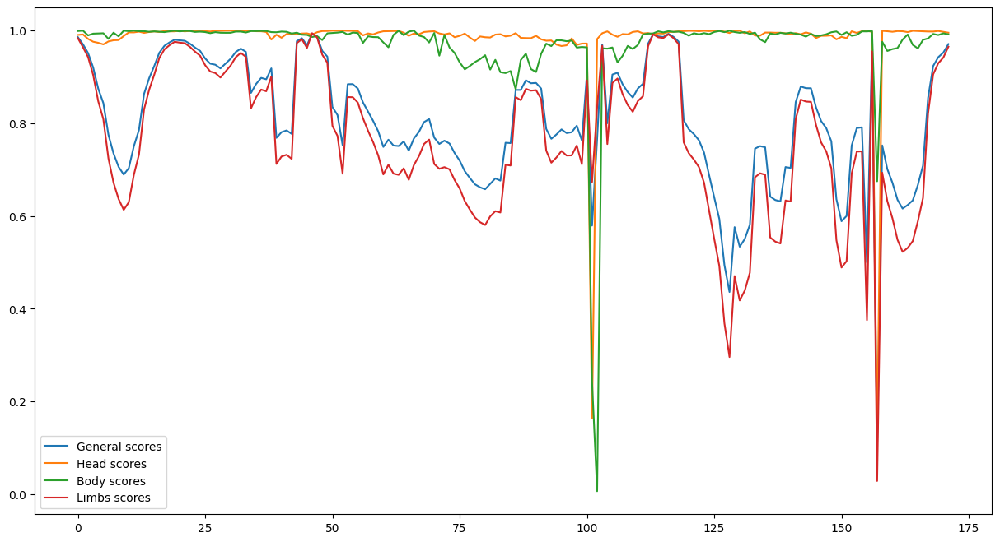

In [18]:
plt.figure(figsize = (15,8))
plt.plot(output['general_scores'], label = "General scores")
plt.plot(output['head_scores'], label = "Head scores")
plt.plot(output['body_scores'], label = "Body scores")
plt.plot(output['limbs_scores'], label = "Limbs scores")
plt.legend()
plt.show()

Как видно в основном колеблется оценка векторов конечностей, от которой во много зависит обая оценка - как и было задумано.
При этом видно что есть два выброса - вероятно связанные с дефектом детекции ключевых точек.

Сгенерируем видео сравнения

In [19]:
compare_model.generate_comparing_video("compare_out.mp4", 800)

  0%|          | 0/172 [00:00<?, ?it/s]

In [20]:
show_video('compare_out.mp4', 1000)

Видео сгенерировалось так как задумано, текс и ключевые точки отображаются как задумано

Теперь, проверим результат сравненя для видео с пллохим повторением движений

In [21]:
compare_model2 = pose_video_model('fail.mp4', 500, 6200, keypoint_threshold=2)

Reading frames...


0it [00:00, ?it/s]

Restoring keypoints...


  0%|          | 0/171 [00:00<?, ?it/s]

Processing keypoints...


  0%|          | 0/172 [00:00<?, ?it/s]

In [22]:
output2 = compare_model2.compare(reference_model)

  0%|          | 0/172 [00:00<?, ?it/s]

In [23]:
print(f"Mean general score: {np.mean(output2['general_scores'])}")
print(f"Mean head score: {np.mean(output2['head_scores'])}")
print(f"Mean body score: {np.mean(output2['body_scores'])}")
print(f"Mean limb score: {np.mean(output2['limbs_scores'])}")

Mean general score: 0.7613710761070251
Mean head score: 0.9651209115982056
Mean body score: 0.9552908539772034
Mean limb score: 0.7116623520851135


И да, как оживдлось результат косинусной близости ниже чем при попытке лучше повторить движения

In [26]:
compare_model2.generate_comparing_video("compare2_out.mp4", 800)

  0%|          | 0/172 [00:00<?, ?it/s]

In [27]:
show_video('compare2_out.mp4', 1000)

Итак видео анализируются, результирующие видео генерируются с отображением скоров. Задача 3 выполена.
Теперь сохраним полуенный класс моели в отдельный модуль и посмотрим его использование в следующем ноутбуке